# Analysis of Strava activities - Mapping activities (almost) like Strava

In this notebook Strava activities (runs, in particular) are mapped and visualized in order to find relevant patterns among them. The ultimate aim is to create, in a final instance, an appealing visualization that resembles the one provided by Strava itself.

### Data loading

This part is common for all notebooks, for simplicity. It takes all the Strava activities collected and stores them in lists, dataframes, geodataframes and trajectories for every type of activity (runs, hikes, rides and all).

In [2]:
# to avoid geopandas warnings, don't run if you don't mind warnings
import warnings
warnings.filterwarnings('ignore')

In [3]:
import geopandas as gpd
import pandas as pd
import numpy as np
import gpxpy
import os
from tqdm import tqdm
import movingpandas as mpd
import utils
import contextily as ctx
from sklearn.cluster import dbscan
import folium
from folium import plugins

In [4]:
activities = []
runs = []
hikes = []
rides = []

In [5]:
for file in tqdm(os.listdir("data/strava_activities/")):
    gpx_file = open("data/strava_activities/{}".format(file), 'r')
    gpx = gpxpy.parse(gpx_file)
    if((gpx.tracks[0].type == 'Run') | (gpx.tracks[0].type == 'running') ):
        runs.append(gpx)
        activities.append(gpx)
    elif(gpx.tracks[0].type == 'Hike'):
        hikes.append(gpx)
        activities.append(gpx)
    elif(gpx.tracks[0].type == 'Ride'):
        rides.append(gpx)
        activities.append(gpx)

100%|██████████| 159/159 [00:14<00:00, 10.84it/s]


In [6]:
# list of dataframes of all the activities
activities_dfList = utils.toList(activities)
runs_dfList = utils.toList(runs)
rides_dfList = utils.toList(rides)
hikes_dfList = utils.toList(hikes)

100%|██████████| 14/14 [00:00<00:00, 16.21it/s]


In [7]:
# Set time as index for movingpandas
for i in range(len(activities_dfList)):
    activities_dfList[i].set_index('time', drop=True, inplace=True)
for i in range(len(runs_dfList)):
    runs_dfList[i].set_index('time', drop=True, inplace=True)
for i in range(len(rides_dfList)):
    rides_dfList[i].set_index('time', drop=True, inplace=True)
for i in range(len(hikes_dfList)):
    hikes_dfList[i].set_index('time', drop=True, inplace=True)

In [8]:
# List of geodataframes of activities
geo_dfList = utils.toGdfList(activities_dfList)
runs_geo_dfList = utils.toGdfList(runs_dfList)
rides_geo_dfList = utils.toGdfList(rides_dfList)
hikes_geo_dfList = utils.toGdfList(hikes_dfList)

100%|██████████| 14/14 [00:00<00:00, 35.27it/s]


In [9]:
# List of all trajectories of the dataset
trajectories = utils.getTrajList(geo_dfList)
runsTrajectories = utils.getTrajList(runs_geo_dfList)
ridesTrajectories = utils.getTrajList(rides_geo_dfList)
hikesTrajectories = utils.getTrajList(hikes_geo_dfList)

### Activities visualization - first attempt

Plot all hike activities in a map. HVplot guarantees a pleasant visualization, but with hikes it's pointless to find clusters of activities. In any case, this is a good example of how trajectories can be mapped together and be easily identified when not overlapped.

In [10]:
hikesToPlot = mpd.TrajectoryCollection(hikesTrajectories)

In [11]:
hikesToPlot.hvplot(line_width=3, geo=True, tiles='EsriImagery')

:Overlay
   .Tiles.I   :Tiles   [x,y]
   .Path.I    :Path   [Longitude,Latitude]
   .Path.II   :Path   [Longitude,Latitude]
   .Path.III  :Path   [Longitude,Latitude]
   .Path.IV   :Path   [Longitude,Latitude]
   .Path.V    :Path   [Longitude,Latitude]
   .Path.VI   :Path   [Longitude,Latitude]
   .Path.VII  :Path   [Longitude,Latitude]
   .Path.VIII :Path   [Longitude,Latitude]
   .Path.IX   :Path   [Longitude,Latitude]
   .Path.X    :Path   [Longitude,Latitude]
   .Path.XI   :Path   [Longitude,Latitude]
   .Path.XII  :Path   [Longitude,Latitude]
   .Path.XIII :Path   [Longitude,Latitude]
   .Path.XIV  :Path   [Longitude,Latitude]

In [12]:
# just in case, this is the code to map all the activities stored
# but it takes about 7-8 mins to render with an old gpu
all = mpd.TrajectoryCollection(trajectories)
#all.hvplot(line_width=3, geo=True, tiles='EsriImagery')

On the other hand, with too many overlapping activities it's complicated to identify how many of them are in a given area (even colours could be misleading). We can isolate starting points and plot them to have a better idea.

In [13]:
starting_points = all.get_start_locations().set_crs('epsg:4326')
starting_points

,elevation,geometry,latitude,longitude
2019-06-06 18:13:25,198.6,POINT Z (11.12007 46.05674 198.60000),46.056745,11.120075
2020-11-19 19:06:51,198.2,POINT Z (11.11502 46.05746 198.20000),46.057457,11.115020
2021-05-08 10:08:24,78.4,POINT Z (10.87843 45.92002 78.40000),45.920023,10.878429
2021-05-04 17:24:42,195.4,POINT Z (11.11215 46.05954 195.40000),46.059543,11.112147
2020-05-17 19:17:09,203.8,POINT Z (11.11181 46.05405 203.80000),46.054046,11.111814
...,...,...,...,...
2019-07-30 18:24:13,188.0,POINT Z (11.11154 46.05242 188.00000),46.052419,11.111539
2021-01-10 18:50:04,189.2,POINT Z (11.11213 46.05954 189.20000),46.059536,11.112131
2020-05-03 19:12:34,201.2,POINT Z (11.11157 46.05244 201.20000),46.052438,11.111570
2021-03-25 19:42:42,216.6,POINT Z (11.12668 46.05870 216.60000),46.058704,11.126684


With a scatter plot of the starting points we can have an idea of how they are distributed.

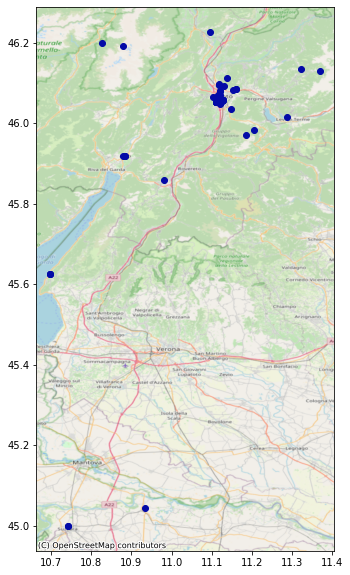

In [14]:
ax = starting_points.plot(figsize=(10,10), color='xkcd:cobalt blue')
ctx.add_basemap(ax, crs=starting_points.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)

### Clustering activities

In [15]:
starting_points['x'] = starting_points.to_crs(epsg=3857).geometry.x
starting_points['y'] = starting_points.to_crs(epsg=3857).geometry.y

In [16]:
bounding_box = [starting_points.x.min(), starting_points.y.min(), starting_points.x.max(), starting_points.y.max()]
basemap, basemap_extent = ctx.bounds2img(*bounding_box, zoom=10,source = ctx.providers.Stamen.Terrain)
data_extent = [starting_points.x.min(), starting_points.x.max(), starting_points.y.min(), starting_points.y.max()]

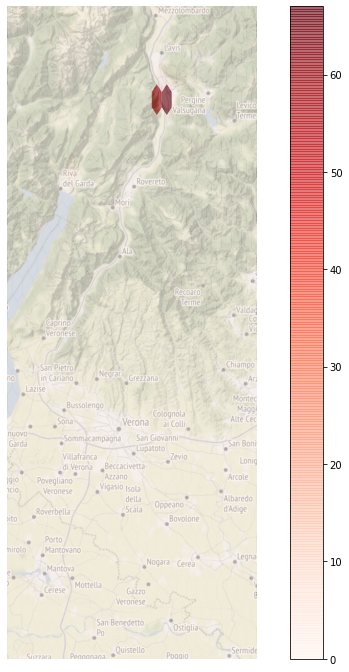

In [17]:
utils.plotHex(starting_points, data_extent, basemap, basemap_extent, hex=25)

As predictable, most activities have been started from Trento. It would be pointless to carry out more analysis at this level, but we can check the distribution over the city area.

In [18]:
trentoBoundary = utils.get_boundary("Trento")

Getting boundaries for Trento
Extracted boundaries for Trento. Time elapsed: 28.46 s


In [19]:
starting_points_tn = gpd.GeoDataFrame()
for i in range(len(starting_points)):
    if trentoBoundary.geometry[0].contains(starting_points[:].geometry[i]):
        starting_points_tn = starting_points_tn.append(starting_points[i:i+1])
print("Attività in zona Trento: {}".format(len(starting_points_tn)))

Attività in zona Trento: 134


In [20]:
bounding_box = [starting_points_tn.x.min(), starting_points_tn.y.min(), starting_points_tn.x.max(), starting_points_tn.y.max()]
basemap, basemap_extent = ctx.bounds2img(*bounding_box, zoom=14,source = ctx.providers.Stamen.Terrain)
data_extent = [starting_points_tn.x.min(), starting_points_tn.x.max(), starting_points_tn.y.min(), starting_points_tn.y.max()]

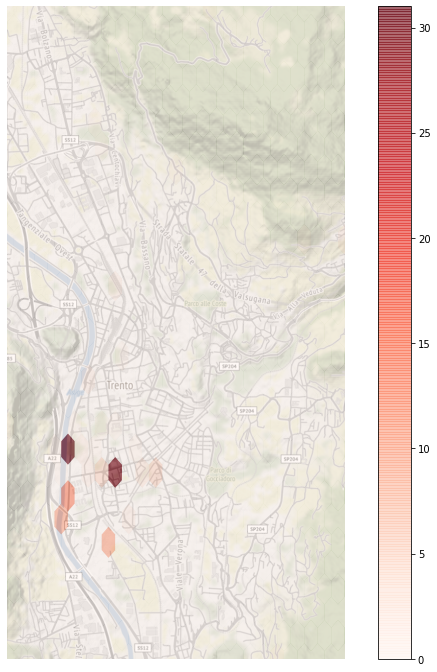

In [21]:
utils.plotHex(starting_points_tn, data_extent, basemap, basemap_extent, hex=25)

It's possible to see a first pattern: most of the activities started in the south-west part of the city, near the Adige river. Is it possible to better understand this?

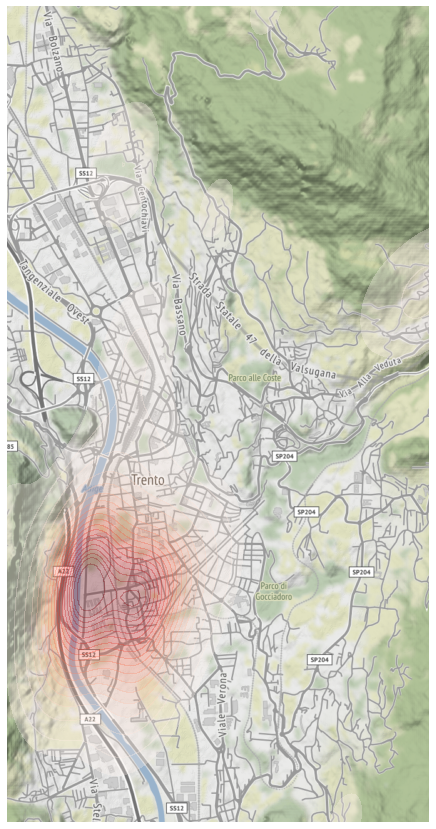

In [22]:
utils.plotKDE(starting_points_tn, data_extent, basemap, basemap_extent, grad=20)

This visualization confirm the main area of starting places. Can we infer something more with a clustering? Maybe the area where I live?

In [23]:
minp = np.round(starting_points_tn.shape[0]*0.15)   # 15% representation
clusterindexes, labels = dbscan(starting_points_tn[['x', 'y']], eps=300, min_samples=minp) # points within 300m
labels=pd.Series(labels, index=starting_points_tn.index)

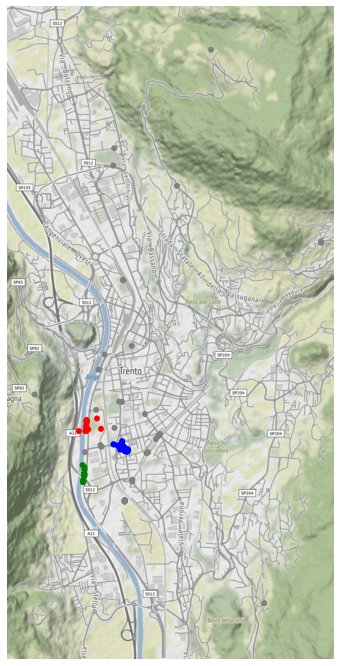

In [24]:
utils.plotClusters(starting_points_tn, labels, basemap, basemap_extent)

Using a dbscan technique it's clear that there are three main areas of starting points: two belongs to the Lungadige, while the other is located in San Pio X neighbourhood. So, assuming that I'm not living on the river, I probably live in the third area found (which is a right guess).

### Strava-like heatmap visualization

For a further visualization, let's check out an heatmap of all the activities loaded. 

In [25]:
coords = []
for i in tqdm(range(len(geo_dfList))):
    for idx, row in geo_dfList[i].iterrows():
        lat = row.latitude
        lon = row.longitude
        coords.append( (lat, lon) )

100%|██████████| 152/152 [00:16<00:00,  9.17it/s]


In [26]:
mapFolium = folium.Map(location=[46.0672,11.1212], tiles='CartoDB dark_matter', zoom_start=12)
plugins.HeatMap(coords, radius=2.5, blur=1.5, min_opacity=0.3, max_value=1, gradient=utils.HEATMAP_GRAD['dark']).add_to(mapFolium)
mapFolium

Thanks to Folium, there is a representation with a heatmap of all the activities. It's easy to notice a greater concentration of points in the areas highlighted before.